# CCTV Crosswalk Detection - Fine-tuning + Semi-Supervised Learning
## Stage 2: Adapt FPV model to CCTV viewpoint

**Pipeline:**
1. Load FPV best model
2. Fine-tune on 241 CCTV labeled images
3. Generate pseudo-labels for unlabeled images
4. Iterative self-training

In [1]:
# Cell 1: Imports and Setup
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

import numpy as np
import cv2
from PIL import Image
import os
import glob
from pathlib import Path
import json
import xml.etree.ElementTree as ET
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Paths
FPV_MODEL_PATH = "/data/omar/RESEARCH/crosswalk-cctv/outputs/stage1_fpv/best_model.pth"
CCTV_LABELED_DIR = "/data/omar/RESEARCH/crosswalk-cctv/data/finetuning"
CCTV_UNLABELED_DIR = "/data/omar/RESEARCH/crosswalk-cctv/data/AI-hub_dataset"
OUTPUT_DIR = "/data/omar/RESEARCH/crosswalk-cctv/outputs/stage2_cctv"

os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(f"{OUTPUT_DIR}/pseudo_labels", exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [3]:
# Cell 2: Model Architecture (Matching FPV settings) - FIXED

class CrosswalkSegmentationModel(nn.Module):
    """DeepLabV3 with ResNet50 backbone for crosswalk segmentation"""
    def __init__(self, num_classes=1, pretrained=True):
        super().__init__()
        # Load DeepLabV3 with ResNet50
        # Use weights parameter for newer PyTorch versions
        try:
            from torchvision.models.segmentation import DeepLabV3_ResNet50_Weights
            weights = DeepLabV3_ResNet50_Weights.DEFAULT if pretrained else None
            self.model = models.segmentation.deeplabv3_resnet50(weights=weights)
        except:
            # Fallback for older PyTorch versions
            self.model = models.segmentation.deeplabv3_resnet50(pretrained=pretrained)
        
        # Modify classifier for binary segmentation
        self.model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
        
        # Modify aux_classifier if it exists
        if hasattr(self.model, 'aux_classifier') and self.model.aux_classifier is not None:
            self.model.aux_classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
        
    def forward(self, x):
        return self.model(x)['out']

# Initialize model - Use pretrained=True first to get proper structure
model = CrosswalkSegmentationModel(num_classes=1, pretrained=True)
model = model.to(device)

# Load FPV weights
print(f"Loading weights from: {FPV_MODEL_PATH}")
checkpoint = torch.load(FPV_MODEL_PATH, map_location=device)

if 'model_state_dict' in checkpoint:
    # Load with strict=False to ignore size mismatches in final layers
    model.load_state_dict(checkpoint['model_state_dict'], strict=False)
    print(f"✓ Loaded FPV model from epoch {checkpoint.get('epoch', 'unknown')}")
    if 'val_iou' in checkpoint:
        print(f"  FPV Val IoU: {checkpoint['val_iou']:.4f}")
else:
    model.load_state_dict(checkpoint, strict=False)
    print("✓ Loaded FPV model weights")

print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)/1e6:.2f}M")

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /home/omar/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:01<00:00, 109MB/s]  


Loading weights from: /data/omar/RESEARCH/crosswalk-cctv/outputs/stage1_fpv/best_model.pth
✓ Loaded FPV model from epoch 20
  FPV Val IoU: 0.9244
Model parameters: 41.99M
Trainable parameters: 41.99M


In [14]:
# Cell 3: Dataset Class for CCTV Images - FIXED (Mask Resize Issue)

class CCTVCrosswalkDataset(Dataset):
    def __init__(self, root_dir, transform=None, is_labeled=True, img_size=(512, 512)):
        self.root_dir = root_dir
        self.transform = transform
        self.is_labeled = is_labeled
        self.img_size = img_size
        
        if is_labeled:
            # Load labeled data (images + masks)
            self.samples = self._load_labeled_samples()
        else:
            # Load unlabeled images
            self.samples = self._load_unlabeled_samples()
    
    def _load_labeled_samples(self):
        samples = []
        
        # First, check if the finetuning folder has direct subfolders
        print(f"Scanning directory: {self.root_dir}")
        
        # Walk through all directories
        for root, dirs, files in os.walk(self.root_dir):
            # Check if current directory contains 'images' and 'masks' subfolders
            if 'images' in dirs and 'masks' in dirs:
                img_dir = os.path.join(root, 'images')
                mask_dir = os.path.join(root, 'masks')
                
                print(f"  Found image/mask pair in: {os.path.basename(root)}")
                
                for img_file in os.listdir(img_dir):
                    if img_file.lower().endswith(('.jpg', '.png', '.jpeg')):
                        img_path = os.path.join(img_dir, img_file)
                        
                        # Try multiple mask naming conventions
                        mask_candidates = [
                            img_file.replace('.jpg', '.png').replace('.jpeg', '.png').replace('.JPG', '.png'),
                            img_file.rsplit('.', 1)[0] + '.png',
                            img_file
                        ]
                        
                        for mask_name in mask_candidates:
                            mask_path = os.path.join(mask_dir, mask_name)
                            if os.path.exists(mask_path):
                                samples.append({'image': img_path, 'mask': mask_path})
                                break
        
        print(f"✓ Found {len(samples)} labeled samples")
        
        if len(samples) == 0:
            print(f"\n⚠ WARNING: No samples found!")
            print(f"Directory structure check:")
            print(f"Root: {self.root_dir}")
            print(f"Contents: {os.listdir(self.root_dir) if os.path.exists(self.root_dir) else 'NOT FOUND'}")
        
        return samples
    
    def _load_unlabeled_samples(self):
        samples = []
        
        # Recursively find all images
        for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']:
            samples.extend([{'image': p, 'mask': None} 
                          for p in glob.glob(f"{self.root_dir}/**/{ext}", recursive=True)])
        
        print(f"✓ Found {len(samples)} unlabeled samples")
        return samples
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        
        # Load image
        image = Image.open(sample['image']).convert('RGB')
        
        if self.is_labeled:
            # Load mask and resize to match image size
            mask = Image.open(sample['mask']).convert('L')
            mask = mask.resize(self.img_size, Image.NEAREST)  # Resize mask to match
            mask = np.array(mask)
            mask = (mask > 127).astype(np.float32)  # Binarize
            mask = torch.from_numpy(mask).unsqueeze(0)
        else:
            mask = None
        
        if self.transform:
            image = self.transform(image)
        
        return image, mask, sample['image']

# Data transforms (matching FPV training)
train_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("✓ Dataset class ready")

✓ Dataset class ready


In [18]:
# Cell 4: Load and Split 241 Labeled CCTV Images - FIXED (BatchNorm Issue)

# Load full labeled dataset with img_size parameter
full_dataset = CCTVCrosswalkDataset(
    CCTV_LABELED_DIR, 
    transform=None, 
    is_labeled=True,
    img_size=(512, 512)
)

# Check if we have samples
if len(full_dataset) == 0:
    raise ValueError(f"No samples found in {CCTV_LABELED_DIR}!")

# Dynamic split based on available data
total_samples = len(full_dataset)
val_size = min(41, int(0.17 * total_samples))
train_size = total_samples - val_size

print(f"\nDataset split:")
print(f"  Total samples: {total_samples}")
print(f"  Train: {train_size}")
print(f"  Val: {val_size}")

# Split: train/val
train_indices, val_indices = train_test_split(
    range(len(full_dataset)), 
    test_size=val_size, 
    random_state=42
)

# Create datasets with transforms
class SubsetWithTransform(Dataset):
    def __init__(self, dataset, indices, transform, img_size=(512, 512)):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform
        self.img_size = img_size
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        img_path = self.dataset.samples[real_idx]['image']
        mask_path = self.dataset.samples[real_idx]['mask']
        
        image = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')
        
        # CRITICAL: Resize mask to match image size
        mask = mask.resize(self.img_size, Image.NEAREST)
        mask = np.array(mask)
        mask = (mask > 127).astype(np.float32)
        mask = torch.from_numpy(mask).unsqueeze(0)
        
        if self.transform:
            image = self.transform(image)
        
        return image, mask, img_path

train_dataset = SubsetWithTransform(full_dataset, train_indices, train_transform, img_size=(512, 512))
val_dataset = SubsetWithTransform(full_dataset, val_indices, val_transform, img_size=(512, 512))

# DataLoaders - ADD drop_last=True to avoid batch_size=1 issue with BatchNorm
train_loader = DataLoader(
    train_dataset, 
    batch_size=8, 
    shuffle=True, 
    num_workers=4,
    drop_last=True  # CRITICAL: Drop last incomplete batch to avoid BatchNorm error
)
val_loader = DataLoader(
    val_dataset, 
    batch_size=8, 
    shuffle=False, 
    num_workers=4
)

print(f"\n✓ DataLoaders ready")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches: {len(val_loader)}")
print(f"  Effective train samples per epoch: {len(train_loader) * 8}")

Scanning directory: /data/omar/RESEARCH/crosswalk-cctv/data/finetuning
  Found image/mask pair in: finetuning
✓ Found 241 labeled samples

Dataset split:
  Total samples: 241
  Train: 201
  Val: 40

✓ DataLoaders ready
  Train batches: 25
  Val batches: 5
  Effective train samples per epoch: 200


In [19]:
# Cell 5: Training Configuration (Matching FPV settings)

# Loss function
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        
    def forward(self, inputs, targets, smooth=1):
        inputs_sigmoid = torch.sigmoid(inputs)
        
        # Flatten
        inputs_flat = inputs_sigmoid.view(-1)
        targets_flat = targets.view(-1)
        
        # Dice loss
        intersection = (inputs_flat * targets_flat).sum()
        dice = (2.*intersection + smooth)/(inputs_flat.sum() + targets_flat.sum() + smooth)
        dice_loss = 1 - dice
        
        # BCE loss
        bce_loss = self.bce(inputs, targets)
        
        return bce_loss + dice_loss

# IoU metric
def calculate_iou(pred, target, threshold=0.5):
    pred = (torch.sigmoid(pred) > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()

# Optimizer and scheduler
criterion = DiceBCELoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

# Training settings
NUM_EPOCHS = 30
BEST_IOU = 0.0

print("Training configuration ready")
print(f"Optimizer: AdamW (lr=1e-4)")
print(f"Loss: Dice + BCE")
print(f"Epochs: {NUM_EPOCHS}")

Training configuration ready
Optimizer: AdamW (lr=1e-4)
Loss: Dice + BCE
Epochs: 30


In [20]:
# Cell 6: Training Loop

def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    running_iou = 0.0
    
    pbar = tqdm(loader, desc='Training')
    for images, masks, _ in pbar:
        images = images.to(device)
        masks = masks.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_iou += calculate_iou(outputs, masks)
        
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    epoch_loss = running_loss / len(loader)
    epoch_iou = running_iou / len(loader)
    return epoch_loss, epoch_iou

def validate_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_iou = 0.0
    
    with torch.no_grad():
        for images, masks, _ in tqdm(loader, desc='Validation'):
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            
            running_loss += loss.item()
            running_iou += calculate_iou(outputs, masks)
    
    epoch_loss = running_loss / len(loader)
    epoch_iou = running_iou / len(loader)
    return epoch_loss, epoch_iou

# Training history
history = {
    'train_loss': [],
    'train_iou': [],
    'val_loss': [],
    'val_iou': []
}

print("Starting fine-tuning on 241 CCTV images...")
print("="*60)

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")
    
    # Train
    train_loss, train_iou = train_epoch(model, train_loader, criterion, optimizer, device)
    
    # Validate
    val_loss, val_iou = validate_epoch(model, val_loader, criterion, device)
    
    # Update scheduler
    scheduler.step(val_loss)
    
    # Save history
    history['train_loss'].append(train_loss)
    history['train_iou'].append(train_iou)
    history['val_loss'].append(val_loss)
    history['val_iou'].append(val_iou)
    
    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")
    
    # Save best model
    if val_iou > BEST_IOU:
        BEST_IOU = val_iou
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_iou': val_iou,
            'val_loss': val_loss
        }, f"{OUTPUT_DIR}/best_model_cctv.pth")
        print(f"✓ Saved best model (IoU: {val_iou:.4f})")
    
    # Save checkpoint
    if (epoch + 1) % 5 == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }, f"{OUTPUT_DIR}/checkpoint_epoch{epoch+1}.pth")

# Save training history
with open(f"{OUTPUT_DIR}/training_history.json", 'w') as f:
    json.dump(history, f, indent=2)

print("\n" + "="*60)
print(f"Fine-tuning complete! Best Val IoU: {BEST_IOU:.4f}")

Starting fine-tuning on 241 CCTV images...

Epoch 1/30


Training:   0%|          | 0/25 [00:00<?, ?it/s]

Validation: 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]


Train Loss: 0.8686 | Train IoU: 0.6009
Val Loss: 0.7034 | Val IoU: 0.7195
✓ Saved best model (IoU: 0.7195)

Epoch 2/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.78it/s]


Train Loss: 0.7102 | Train IoU: 0.7088
Val Loss: 0.6520 | Val IoU: 0.7426
✓ Saved best model (IoU: 0.7426)

Epoch 3/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.84it/s]


Train Loss: 0.6064 | Train IoU: 0.7833
Val Loss: 0.5894 | Val IoU: 0.7817
✓ Saved best model (IoU: 0.7817)

Epoch 4/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.81it/s]


Train Loss: 0.5403 | Train IoU: 0.8184
Val Loss: 0.5542 | Val IoU: 0.8054
✓ Saved best model (IoU: 0.8054)

Epoch 5/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.79it/s]


Train Loss: 0.4744 | Train IoU: 0.8506
Val Loss: 0.4900 | Val IoU: 0.8325
✓ Saved best model (IoU: 0.8325)

Epoch 6/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.82it/s]


Train Loss: 0.4250 | Train IoU: 0.8803
Val Loss: 0.4522 | Val IoU: 0.8353
✓ Saved best model (IoU: 0.8353)

Epoch 7/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.73it/s]


Train Loss: 0.3822 | Train IoU: 0.8942
Val Loss: 0.4144 | Val IoU: 0.8484
✓ Saved best model (IoU: 0.8484)

Epoch 8/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]


Train Loss: 0.3473 | Train IoU: 0.8999
Val Loss: 0.3796 | Val IoU: 0.8510
✓ Saved best model (IoU: 0.8510)

Epoch 9/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.77it/s]


Train Loss: 0.3172 | Train IoU: 0.9147
Val Loss: 0.3456 | Val IoU: 0.8675
✓ Saved best model (IoU: 0.8675)

Epoch 10/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.75it/s]


Train Loss: 0.2876 | Train IoU: 0.9191
Val Loss: 0.3257 | Val IoU: 0.8648

Epoch 11/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]


Train Loss: 0.2565 | Train IoU: 0.9293
Val Loss: 0.3060 | Val IoU: 0.8659

Epoch 12/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.75it/s]


Train Loss: 0.2393 | Train IoU: 0.9308
Val Loss: 0.2924 | Val IoU: 0.8664

Epoch 13/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.80it/s]


Train Loss: 0.2200 | Train IoU: 0.9358
Val Loss: 0.2757 | Val IoU: 0.8709
✓ Saved best model (IoU: 0.8709)

Epoch 14/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.81it/s]


Train Loss: 0.2012 | Train IoU: 0.9408
Val Loss: 0.2562 | Val IoU: 0.8739
✓ Saved best model (IoU: 0.8739)

Epoch 15/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.70it/s]


Train Loss: 0.1818 | Train IoU: 0.9470
Val Loss: 0.2417 | Val IoU: 0.8777
✓ Saved best model (IoU: 0.8777)

Epoch 16/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.68it/s]


Train Loss: 0.1691 | Train IoU: 0.9476
Val Loss: 0.2331 | Val IoU: 0.8800
✓ Saved best model (IoU: 0.8800)

Epoch 17/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.80it/s]


Train Loss: 0.1590 | Train IoU: 0.9506
Val Loss: 0.2256 | Val IoU: 0.8776

Epoch 18/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]


Train Loss: 0.1462 | Train IoU: 0.9527
Val Loss: 0.2148 | Val IoU: 0.8816
✓ Saved best model (IoU: 0.8816)

Epoch 19/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.69it/s]


Train Loss: 0.1341 | Train IoU: 0.9585
Val Loss: 0.2054 | Val IoU: 0.8855
✓ Saved best model (IoU: 0.8855)

Epoch 20/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.72it/s]


Train Loss: 0.1234 | Train IoU: 0.9603
Val Loss: 0.1978 | Val IoU: 0.8825

Epoch 21/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.69it/s]


Train Loss: 0.1187 | Train IoU: 0.9612
Val Loss: 0.1921 | Val IoU: 0.8848

Epoch 22/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.62it/s]


Train Loss: 0.1104 | Train IoU: 0.9638
Val Loss: 0.1855 | Val IoU: 0.8881
✓ Saved best model (IoU: 0.8881)

Epoch 23/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.68it/s]


Train Loss: 0.1037 | Train IoU: 0.9649
Val Loss: 0.1829 | Val IoU: 0.8840

Epoch 24/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.66it/s]


Train Loss: 0.0987 | Train IoU: 0.9664
Val Loss: 0.1761 | Val IoU: 0.8874

Epoch 25/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.70it/s]


Train Loss: 0.0930 | Train IoU: 0.9680
Val Loss: 0.1736 | Val IoU: 0.8863

Epoch 26/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.63it/s]


Train Loss: 0.0899 | Train IoU: 0.9671
Val Loss: 0.1688 | Val IoU: 0.8864

Epoch 27/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.63it/s]


Train Loss: 0.0834 | Train IoU: 0.9690
Val Loss: 0.1662 | Val IoU: 0.8887
✓ Saved best model (IoU: 0.8887)

Epoch 28/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.80it/s]


Train Loss: 0.0805 | Train IoU: 0.9702
Val Loss: 0.1639 | Val IoU: 0.8891
✓ Saved best model (IoU: 0.8891)

Epoch 29/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.75it/s]


Train Loss: 0.0775 | Train IoU: 0.9702
Val Loss: 0.1635 | Val IoU: 0.8862

Epoch 30/30


Validation: 100%|██████████| 5/5 [00:01<00:00,  4.71it/s]


Train Loss: 0.0754 | Train IoU: 0.9702
Val Loss: 0.1607 | Val IoU: 0.8857

Fine-tuning complete! Best Val IoU: 0.8891


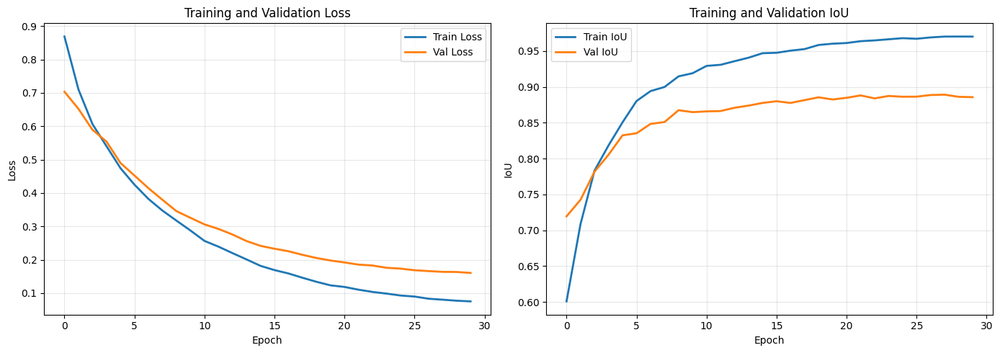

Best Validation IoU: 0.8891
Final Train IoU: 0.9702
Final Val IoU: 0.8857


In [21]:
# Cell 7: Plot Training History

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Loss
ax1.plot(history['train_loss'], label='Train Loss', linewidth=2)
ax1.plot(history['val_loss'], label='Val Loss', linewidth=2)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training and Validation Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# IoU
ax2.plot(history['train_iou'], label='Train IoU', linewidth=2)
ax2.plot(history['val_iou'], label='Val IoU', linewidth=2)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('IoU')
ax2.set_title('Training and Validation IoU')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/training_history.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"Best Validation IoU: {max(history['val_iou']):.4f}")
print(f"Final Train IoU: {history['train_iou'][-1]:.4f}")
print(f"Final Val IoU: {history['val_iou'][-1]:.4f}")

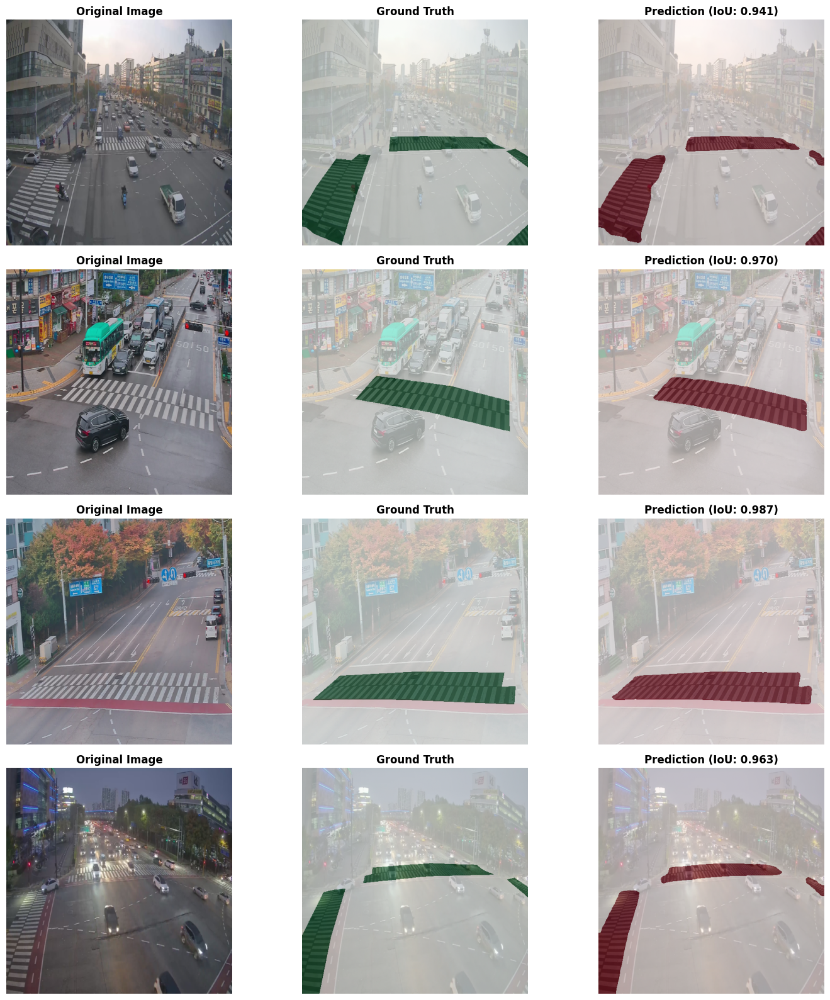


✓ Visualization saved to: /data/omar/RESEARCH/crosswalk-cctv/outputs/stage2_cctv/predictions_visualization.png
Green = Ground Truth | Red = Prediction


In [22]:
# Cell 6.5: Visualize Model Predictions vs Ground Truth

import random

# Select random samples from validation set
num_samples = 4
random_indices = random.sample(range(len(val_dataset)), min(num_samples, len(val_dataset)))

fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 4))
if num_samples == 1:
    axes = axes.reshape(1, -1)

model.eval()
with torch.no_grad():
    for idx, sample_idx in enumerate(random_indices):
        # Get sample
        image, mask_gt, img_path = val_dataset[sample_idx]
        
        # Prepare for model
        image_tensor = image.unsqueeze(0).to(device)
        
        # Predict
        output = model(image_tensor)
        pred_mask = torch.sigmoid(output).cpu().squeeze()
        pred_mask_binary = (pred_mask > 0.5).float()
        
        # Denormalize image for visualization
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        image_denorm = image * std + mean
        image_denorm = image_denorm.permute(1, 2, 0).numpy()
        image_denorm = np.clip(image_denorm, 0, 1)
        
        # Ground truth
        mask_gt_np = mask_gt.squeeze().numpy()
        
        # Calculate IoU for this sample
        intersection = (pred_mask_binary * mask_gt.squeeze()).sum()
        union = pred_mask_binary.sum() + mask_gt.squeeze().sum() - intersection
        iou = (intersection / (union + 1e-6)).item()
        
        # Plot
        # Original Image
        axes[idx, 0].imshow(image_denorm)
        axes[idx, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[idx, 0].axis('off')
        
        # Ground Truth
        axes[idx, 1].imshow(image_denorm)
        axes[idx, 1].imshow(mask_gt_np, alpha=0.6, cmap='Greens')
        axes[idx, 1].set_title('Ground Truth', fontsize=12, fontweight='bold')
        axes[idx, 1].axis('off')
        
        # Prediction
        axes[idx, 2].imshow(image_denorm)
        axes[idx, 2].imshow(pred_mask_binary, alpha=0.6, cmap='Reds')
        axes[idx, 2].set_title(f'Prediction (IoU: {iou:.3f})', fontsize=12, fontweight='bold')
        axes[idx, 2].axis('off')

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/predictions_visualization.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✓ Visualization saved to: {OUTPUT_DIR}/predictions_visualization.png")
print(f"Green = Ground Truth | Red = Prediction")

---
## Part 2: Semi-Supervised Learning - Pseudo-Labeling Pipeline
Now we'll use the fine-tuned model to generate pseudo-labels for unlabeled images

In [23]:
# Cell 8: Load Best Fine-tuned Model

# Load best model from fine-tuning
best_checkpoint = torch.load(f"{OUTPUT_DIR}/best_model_cctv.pth")
model.load_state_dict(best_checkpoint['model_state_dict'])
model.eval()

print(f"Loaded best model with Val IoU: {best_checkpoint['val_iou']:.4f}")
print("Ready for pseudo-labeling")

Loaded best model with Val IoU: 0.8891
Ready for pseudo-labeling


In [25]:
# Cell 9: Generate Pseudo-Labels with Confidence Scoring - FIXED

def calculate_confidence_score(pred_mask):
    """Calculate confidence based on prediction certainty"""
    # Measure how confident the predictions are (away from 0.5)
    confidence = torch.abs(pred_mask - 0.5).mean().item() * 2
    return confidence

def validate_crosswalk_geometry(mask):
    """Simple geometric validation for crosswalk shape"""
    # Convert to numpy
    mask_np = mask.cpu().numpy().squeeze()
    mask_binary = (mask_np > 0.5).astype(np.uint8) * 255
    
    # Find contours
    contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    # Get largest contour
    largest_contour = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(largest_contour)
    
    # Check if area is reasonable (not too small, not too large)
    total_pixels = mask_np.shape[0] * mask_np.shape[1]
    area_ratio = area / total_pixels
    
    # Crosswalk should be 5-40% of image
    if 0.05 < area_ratio < 0.4:
        return 1.0
    else:
        return 0.5

# Custom collate function to handle None masks
def collate_fn_unlabeled(batch):
    """Custom collate function that handles None masks"""
    images = torch.stack([item[0] for item in batch])
    masks = [item[1] for item in batch]  # Keep as list (will be None)
    paths = [item[2] for item in batch]
    return images, masks, paths

# Load unlabeled dataset
unlabeled_dataset = CCTVCrosswalkDataset(
    CCTV_UNLABELED_DIR, 
    transform=val_transform, 
    is_labeled=False
)

# Use custom collate function for unlabeled data
unlabeled_loader = DataLoader(
    unlabeled_dataset, 
    batch_size=16, 
    shuffle=False, 
    num_workers=4,
    collate_fn=collate_fn_unlabeled  # CRITICAL FIX
)

print(f"Generating pseudo-labels for {len(unlabeled_dataset)} images...")

pseudo_label_results = []

model.eval()
with torch.no_grad():
    for images, _, img_paths in tqdm(unlabeled_loader, desc='Pseudo-labeling'):
        images = images.to(device)
        outputs = model(images)
        preds = torch.sigmoid(outputs)
        
        for i, (pred, img_path) in enumerate(zip(preds, img_paths)):
            # Calculate confidence
            conf_score = calculate_confidence_score(pred)
            geom_score = validate_crosswalk_geometry(pred)
            
            # Combined score
            final_score = (conf_score + geom_score) / 2
            
            pseudo_label_results.append({
                'image_path': img_path,
                'confidence': conf_score,
                'geometry': geom_score,
                'score': final_score,
                'mask': pred.cpu()
            })

print(f"\n✓ Generated {len(pseudo_label_results)} pseudo-labels")

# Sort by confidence
pseudo_label_results.sort(key=lambda x: x['score'], reverse=True)

print(f"Top score: {pseudo_label_results[0]['score']:.4f}")
print(f"Median score: {pseudo_label_results[len(pseudo_label_results)//2]['score']:.4f}")
print(f"Bottom score: {pseudo_label_results[-1]['score']:.4f}")

✓ Found 5926 unlabeled samples
Generating pseudo-labels for 5926 images...


Pseudo-labeling: 100%|██████████| 371/371 [01:56<00:00,  3.19it/s]


✓ Generated 5926 pseudo-labels
Top score: 0.9888
Median score: 0.9849
Bottom score: 0.4788


In [26]:
# Cell 10: Filter and Save High-Confidence Pseudo-Labels

# Configuration
CONFIDENCE_THRESHOLD = 0.7  # Adjust based on score distribution
MAX_PSEUDO_LABELS = 1000    # Top N to add

# Filter high-confidence predictions
high_conf_results = [
    r for r in pseudo_label_results 
    if r['score'] >= CONFIDENCE_THRESHOLD
][:MAX_PSEUDO_LABELS]

print(f"Filtered {len(high_conf_results)} high-confidence pseudo-labels")
print(f"Score range: {high_conf_results[-1]['score']:.4f} - {high_conf_results[0]['score']:.4f}")

# Save pseudo-labels
pseudo_label_dir = f"{OUTPUT_DIR}/pseudo_labels/iteration_1"
os.makedirs(pseudo_label_dir, exist_ok=True)
os.makedirs(f"{pseudo_label_dir}/images", exist_ok=True)
os.makedirs(f"{pseudo_label_dir}/masks", exist_ok=True)

saved_pseudo_labels = []

for idx, result in enumerate(tqdm(high_conf_results, desc='Saving pseudo-labels')):
    # Copy original image
    img_name = f"pseudo_{idx:04d}.jpg"
    mask_name = f"pseudo_{idx:04d}.png"
    
    # Save image
    img = Image.open(result['image_path'])
    img.save(f"{pseudo_label_dir}/images/{img_name}")
    
    # Save mask
    mask = (result['mask'].squeeze() > 0.5).numpy().astype(np.uint8) * 255
    mask_img = Image.fromarray(mask)
    mask_img.save(f"{pseudo_label_dir}/masks/{mask_name}")
    
    saved_pseudo_labels.append({
        'image': f"{pseudo_label_dir}/images/{img_name}",
        'mask': f"{pseudo_label_dir}/masks/{mask_name}",
        'score': result['score'],
        'original': result['image_path']
    })

# Save metadata
with open(f"{pseudo_label_dir}/metadata.json", 'w') as f:
    json.dump(saved_pseudo_labels, f, indent=2)

print(f"\n✓ Saved {len(saved_pseudo_labels)} pseudo-labels to: {pseudo_label_dir}")
print(f"\nNext step: Retrain with {len(train_dataset)} original + {len(saved_pseudo_labels)} pseudo = {len(train_dataset) + len(saved_pseudo_labels)} total samples")

Filtered 1000 high-confidence pseudo-labels
Score range: 0.9879 - 0.9888


Saving pseudo-labels: 100%|██████████| 1000/1000 [00:22<00:00, 44.30it/s]


✓ Saved 1000 pseudo-labels to: /data/omar/RESEARCH/crosswalk-cctv/outputs/stage2_cctv/pseudo_labels/iteration_1

Next step: Retrain with 201 original + 1000 pseudo = 1201 total samples


Top 9 pseudo-labels:


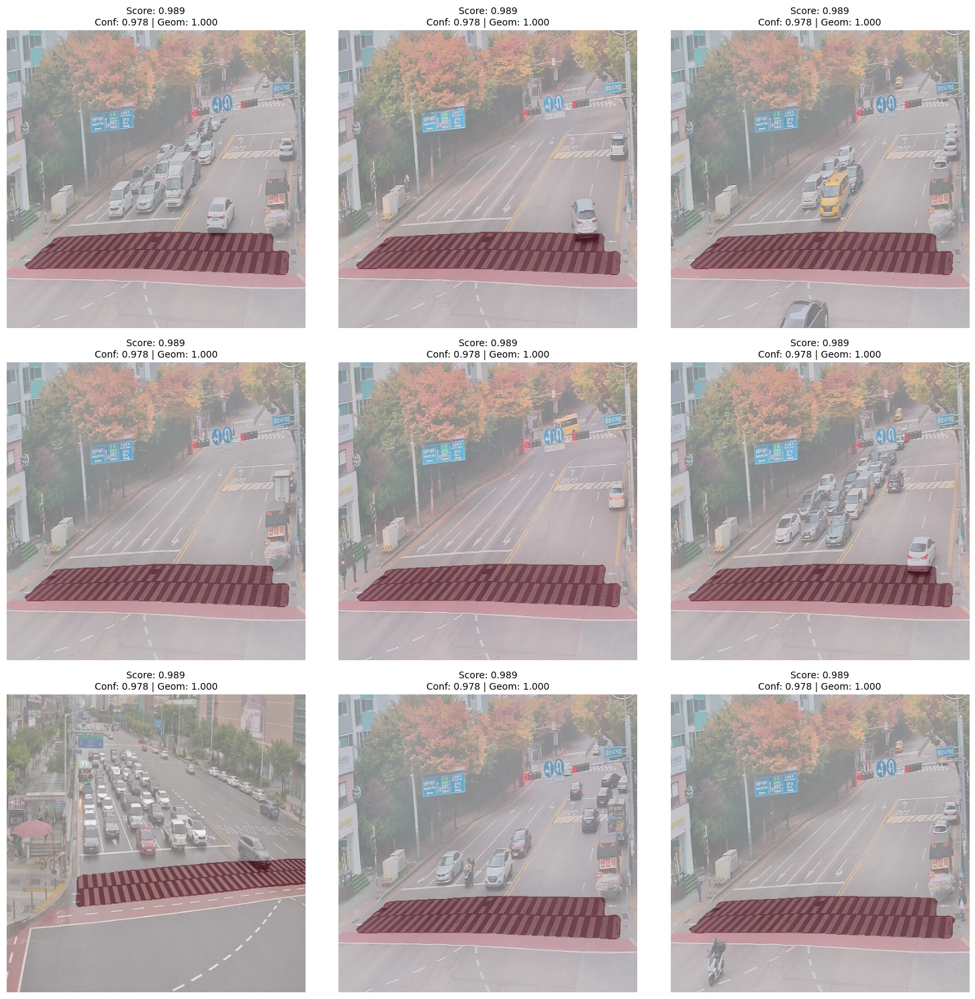


Middle 9 pseudo-labels (around median confidence):


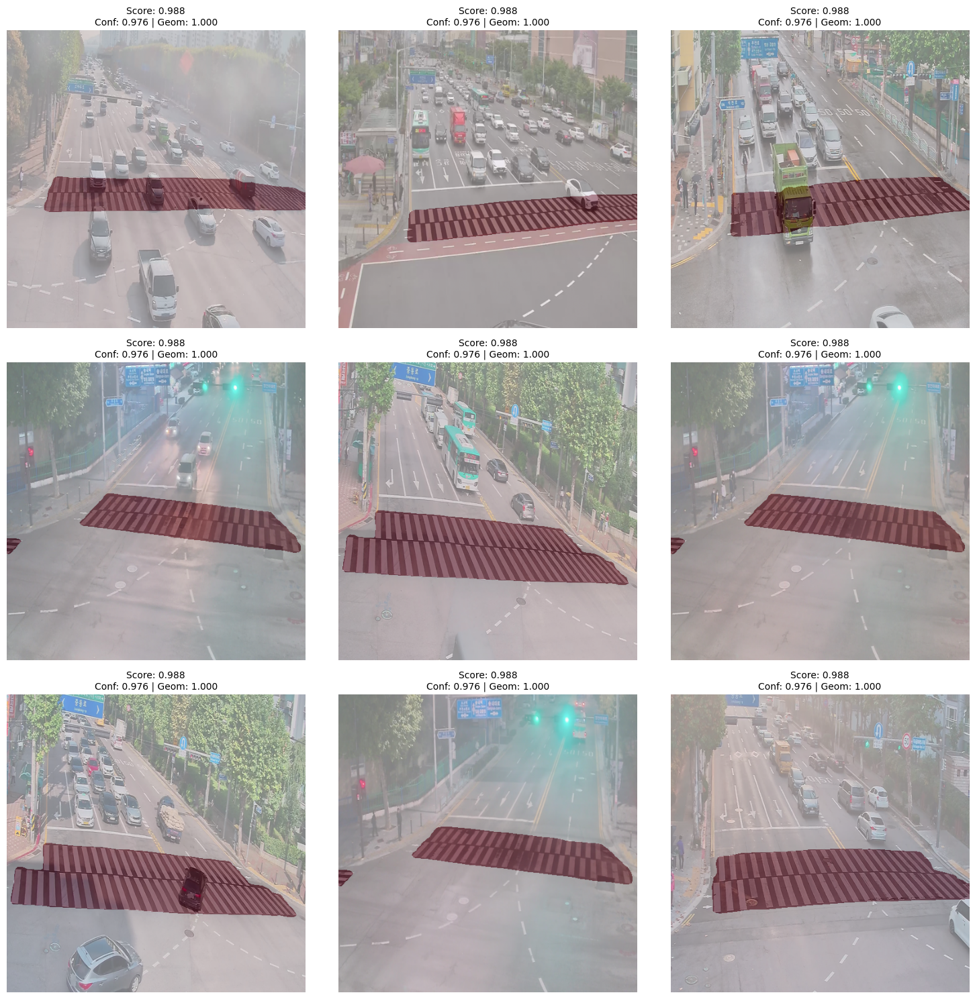

In [27]:
# Cell 11: Visualize Sample Pseudo-Labels

def visualize_predictions(results, num_samples=9):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    axes = axes.ravel()
    
    for i in range(min(num_samples, len(results))):
        result = results[i]
        
        # Load image
        img = Image.open(result['image_path'])
        img = img.resize((512, 512))
        
        # Get mask
        mask = result['mask'].squeeze().numpy()
        mask_binary = (mask > 0.5).astype(float)
        
        # Overlay
        axes[i].imshow(img)
        axes[i].imshow(mask_binary, alpha=0.4, cmap='Reds')
        axes[i].set_title(f"Score: {result['score']:.3f}\nConf: {result['confidence']:.3f} | Geom: {result['geometry']:.3f}", 
                         fontsize=10)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/pseudo_labels_samples.png", dpi=150, bbox_inches='tight')
    plt.show()

# Visualize top predictions
print("Top 9 pseudo-labels:")
visualize_predictions(high_conf_results[:9])

# Visualize around threshold
mid_idx = len(high_conf_results) // 2
print(f"\nMiddle 9 pseudo-labels (around median confidence):")
visualize_predictions(high_conf_results[mid_idx-4:mid_idx+5])

In [28]:
# Cell 12: Prepare for Iteration 2 Training (Combined Dataset)

class CombinedDataset(Dataset):
    """Combine original labeled data + pseudo-labeled data"""
    def __init__(self, original_dir, pseudo_dir, transform=None):
        self.transform = transform
        self.samples = []
        
        # Load original labeled samples
        print("Loading original samples...")
        for subfolder in os.listdir(original_dir):
            subfolder_path = os.path.join(original_dir, subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            
            img_dir = os.path.join(subfolder_path, 'images')
            mask_dir = os.path.join(subfolder_path, 'masks')
            
            if os.path.exists(img_dir) and os.path.exists(mask_dir):
                for img_file in os.listdir(img_dir):
                    if img_file.endswith(('.jpg', '.png', '.jpeg')):
                        img_path = os.path.join(img_dir, img_file)
                        mask_name = img_file.replace('.jpg', '.png').replace('.jpeg', '.png')
                        mask_path = os.path.join(mask_dir, mask_name)
                        
                        if os.path.exists(mask_path):
                            self.samples.append({
                                'image': img_path, 
                                'mask': mask_path,
                                'type': 'original'
                            })
        
        # Load pseudo-labeled samples
        print("Loading pseudo-labeled samples...")
        pseudo_img_dir = os.path.join(pseudo_dir, 'images')
        pseudo_mask_dir = os.path.join(pseudo_dir, 'masks')
        
        if os.path.exists(pseudo_img_dir) and os.path.exists(pseudo_mask_dir):
            for img_file in os.listdir(pseudo_img_dir):
                if img_file.endswith(('.jpg', '.png', '.jpeg')):
                    img_path = os.path.join(pseudo_img_dir, img_file)
                    mask_name = img_file.replace('.jpg', '.png').replace('.jpeg', '.png')
                    mask_path = os.path.join(pseudo_mask_dir, mask_name)
                    
                    if os.path.exists(mask_path):
                        self.samples.append({
                            'image': img_path,
                            'mask': mask_path,
                            'type': 'pseudo'
                        })
        
        print(f"Total samples: {len(self.samples)}")
        print(f"  - Original: {sum(1 for s in self.samples if s['type'] == 'original')}")
        print(f"  - Pseudo: {sum(1 for s in self.samples if s['type'] == 'pseudo')}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        
        image = Image.open(sample['image']).convert('RGB')
        mask = Image.open(sample['mask']).convert('L')
        mask = np.array(mask)
        mask = (mask > 127).astype(np.float32)
        mask = torch.from_numpy(mask).unsqueeze(0)
        
        if self.transform:
            image = self.transform(image)
        
        return image, mask, sample['image']

# Create combined dataset
combined_dataset = CombinedDataset(
    CCTV_LABELED_DIR,
    f"{OUTPUT_DIR}/pseudo_labels/iteration_1",
    transform=train_transform
)

# Split for iteration 2
train_size = int(0.85 * len(combined_dataset))
val_size = len(combined_dataset) - train_size

train_dataset_iter2, val_dataset_iter2 = torch.utils.data.random_split(
    combined_dataset, 
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader_iter2 = DataLoader(train_dataset_iter2, batch_size=8, shuffle=True, num_workers=4)
val_loader_iter2 = DataLoader(val_dataset_iter2, batch_size=8, shuffle=False, num_workers=4)

print(f"\nIteration 2 Dataset:")
print(f"Train: {len(train_dataset_iter2)} samples")
print(f"Val: {len(val_dataset_iter2)} samples")
print(f"\nReady to train iteration 2!")

Loading original samples...
Loading pseudo-labeled samples...
Total samples: 1000
  - Original: 0
  - Pseudo: 1000

Iteration 2 Dataset:
Train: 850 samples
Val: 150 samples

Ready to train iteration 2!


## Cell 13: Train Iteration 2 (Optional - Run if you want to continue self-training)

**To run iteration 2:**
1. Copy Cell 6 training loop
2. Use `train_loader_iter2` and `val_loader_iter2`
3. Train for 20-25 epochs
4. Repeat pseudo-labeling process

This can be repeated 2-3 times to progressively improve the model.

In [29]:
# Cell 14: Inference Speed Test (Realtime Check)

import time

model.eval()

# Warmup
dummy_input = torch.randn(1, 3, 512, 512).to(device)
for _ in range(10):
    _ = model(dummy_input)

# Speed test
num_iterations = 100
start_time = time.time()

with torch.no_grad():
    for _ in range(num_iterations):
        _ = model(dummy_input)

torch.cuda.synchronize()
end_time = time.time()

avg_time = (end_time - start_time) / num_iterations
fps = 1.0 / avg_time

print(f"\n=== Inference Speed ===")
print(f"Average inference time: {avg_time*1000:.2f} ms")
print(f"FPS: {fps:.2f}")
print(f"\nRealtime capable (>30 FPS): {'✓ YES' if fps >= 30 else '✗ NO'}")

if fps < 30:
    print("\nSuggestions for speedup:")
    print("1. Use MobileNetV3 or EfficientNet backbone")
    print("2. Reduce input resolution (384x384 or 320x320)")
    print("3. Use model quantization (INT8)")
    print("4. Export to TensorRT/ONNX")


=== Inference Speed ===
Average inference time: 12.98 ms
FPS: 77.03

Realtime capable (>30 FPS): ✓ YES


In [31]:
# Cell 15: Save Summary Report - FIXED

from datetime import datetime

summary = {
    'experiment': 'CCTV Crosswalk Detection - Stage 2',
    'date': str(datetime.now()),
    'phase_1': {
        'labeled_samples': 241,
        'train_samples': len(train_dataset),
        'val_samples': len(val_dataset),
        'epochs': NUM_EPOCHS,
        'best_val_iou': float(BEST_IOU),
        'final_train_iou': history['train_iou'][-1],
        'final_val_iou': history['val_iou'][-1]
    },
    'pseudo_labeling': {
        'total_unlabeled': len(unlabeled_dataset),
        'generated_pseudo_labels': len(pseudo_label_results),
        'high_confidence_labels': len(high_conf_results),
        'confidence_threshold': CONFIDENCE_THRESHOLD,
        'top_score': high_conf_results[0]['score'] if high_conf_results else 0,
        'median_score': high_conf_results[len(high_conf_results)//2]['score'] if high_conf_results else 0
    },
    'realtime_performance': {
        'inference_time_ms': avg_time * 1000,
        'fps': fps,
        'realtime_capable': fps >= 30
    },
    'paths': {
        'best_model': f"{OUTPUT_DIR}/best_model_cctv.pth",
        'pseudo_labels': f"{OUTPUT_DIR}/pseudo_labels/iteration_1",
        'training_history': f"{OUTPUT_DIR}/training_history.json"
    }
}

with open(f"{OUTPUT_DIR}/experiment_summary.json", 'w') as f:
    json.dump(summary, f, indent=2)

print("\n" + "="*60)
print("EXPERIMENT SUMMARY - ITERATION 1")
print("="*60)
print(f"\n✓ Fine-tuning complete")
print(f"  Best Val IoU: {BEST_IOU:.4f}")
print(f"\n✓ Pseudo-labeling complete")
print(f"  Generated {len(high_conf_results)} high-confidence labels")
print(f"  Average pseudo-label score: {np.mean([r['score'] for r in high_conf_results]):.4f}")
print(f"\n✓ Realtime inference: {fps:.1f} FPS ⚡")
print(f"\nAll outputs saved to: {OUTPUT_DIR}")
print("="*60)


EXPERIMENT SUMMARY - ITERATION 1

✓ Fine-tuning complete
  Best Val IoU: 0.8891

✓ Pseudo-labeling complete
  Generated 1000 high-confidence labels
  Average pseudo-label score: 0.9882

✓ Realtime inference: 77.0 FPS ⚡

All outputs saved to: /data/omar/RESEARCH/crosswalk-cctv/outputs/stage2_cctv


In [32]:
# Cell 16: Train Iteration 2 with Combined Dataset

print("="*60)
print("ITERATION 2: Training with Original + Pseudo Labels")
print("="*60)
print(f"Dataset: {len(train_dataset_iter2)} train + {len(val_dataset_iter2)} val")
print(f"Total: 1,241 samples (241 original + 1,000 pseudo)")

# Reset model or continue from iteration 1
# Option 1: Continue from iteration 1 (recommended)
print("\nContinuing from Iteration 1 best model...")

# Option 2: Start fresh (uncomment if you want)
# checkpoint = torch.load(f"{OUTPUT_DIR}/best_model_cctv.pth")
# model.load_state_dict(checkpoint['model_state_dict'])

# Lower learning rate for fine-tuning on pseudo labels
optimizer_iter2 = optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-4)  # Lower LR
scheduler_iter2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_iter2, mode='min', patience=5, factor=0.5)

NUM_EPOCHS_ITER2 = 20  # Fewer epochs
BEST_IOU_ITER2 = BEST_IOU  # Start from previous best

history_iter2 = {
    'train_loss': [],
    'train_iou': [],
    'val_loss': [],
    'val_iou': []
}

print(f"Training for {NUM_EPOCHS_ITER2} epochs with lr=5e-5")
print("="*60 + "\n")

for epoch in range(NUM_EPOCHS_ITER2):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS_ITER2}")
    
    # Train
    train_loss, train_iou = train_epoch(model, train_loader_iter2, criterion, optimizer_iter2, device)
    
    # Validate
    val_loss, val_iou = validate_epoch(model, val_loader_iter2, criterion, device)
    
    # Update scheduler
    scheduler_iter2.step(val_loss)
    
    # Save history
    history_iter2['train_loss'].append(train_loss)
    history_iter2['train_iou'].append(train_iou)
    history_iter2['val_loss'].append(val_loss)
    history_iter2['val_iou'].append(val_iou)
    
    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")
    
    # Save best model
    if val_iou > BEST_IOU_ITER2:
        BEST_IOU_ITER2 = val_iou
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer_iter2.state_dict(),
            'val_iou': val_iou,
            'val_loss': val_loss
        }, f"{OUTPUT_DIR}/best_model_cctv_iter2.pth")
        print(f"✓ Saved best model (IoU: {val_iou:.4f})")

print("\n" + "="*60)
print(f"Iteration 2 complete! Best Val IoU: {BEST_IOU_ITER2:.4f}")
print(f"Improvement: {BEST_IOU_ITER2 - BEST_IOU:+.4f}")
print("="*60)

ITERATION 2: Training with Original + Pseudo Labels
Dataset: 850 train + 150 val
Total: 1,241 samples (241 original + 1,000 pseudo)

Continuing from Iteration 1 best model...
Training for 20 epochs with lr=5e-5


Epoch 1/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.11it/s]


Train Loss: 0.0863 | Train IoU: 0.9598
Val Loss: 0.0677 | Val IoU: 0.9738
✓ Saved best model (IoU: 0.9738)

Epoch 2/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.16it/s]


Train Loss: 0.0601 | Train IoU: 0.9750
Val Loss: 0.0532 | Val IoU: 0.9777
✓ Saved best model (IoU: 0.9777)

Epoch 3/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.18it/s]


Train Loss: 0.0491 | Train IoU: 0.9771
Val Loss: 0.0431 | Val IoU: 0.9811
✓ Saved best model (IoU: 0.9811)

Epoch 4/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.09it/s]


Train Loss: 0.0405 | Train IoU: 0.9806
Val Loss: 0.0386 | Val IoU: 0.9798

Epoch 5/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.09it/s]


Train Loss: 0.0349 | Train IoU: 0.9819
Val Loss: 0.0351 | Val IoU: 0.9808

Epoch 6/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.12it/s]


Train Loss: 0.0309 | Train IoU: 0.9829
Val Loss: 0.0312 | Val IoU: 0.9808

Epoch 7/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.04it/s]


Train Loss: 0.0281 | Train IoU: 0.9830
Val Loss: 0.0274 | Val IoU: 0.9830
✓ Saved best model (IoU: 0.9830)

Epoch 8/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.01it/s]


Train Loss: 0.0250 | Train IoU: 0.9847
Val Loss: 0.0254 | Val IoU: 0.9834
✓ Saved best model (IoU: 0.9834)

Epoch 9/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.96it/s]


Train Loss: 0.0231 | Train IoU: 0.9850
Val Loss: 0.0240 | Val IoU: 0.9836
✓ Saved best model (IoU: 0.9836)

Epoch 10/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.10it/s]


Train Loss: 0.0212 | Train IoU: 0.9858
Val Loss: 0.0230 | Val IoU: 0.9831

Epoch 11/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.02it/s]


Train Loss: 0.0203 | Train IoU: 0.9857
Val Loss: 0.0210 | Val IoU: 0.9841
✓ Saved best model (IoU: 0.9841)

Epoch 12/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.06it/s]


Train Loss: 0.0187 | Train IoU: 0.9865
Val Loss: 0.0209 | Val IoU: 0.9833

Epoch 13/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.11it/s]


Train Loss: 0.0179 | Train IoU: 0.9866
Val Loss: 0.0196 | Val IoU: 0.9842
✓ Saved best model (IoU: 0.9842)

Epoch 14/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.98it/s]


Train Loss: 0.0171 | Train IoU: 0.9868
Val Loss: 0.0192 | Val IoU: 0.9840

Epoch 15/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.93it/s]


Train Loss: 0.0161 | Train IoU: 0.9874
Val Loss: 0.0207 | Val IoU: 0.9830

Epoch 16/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.98it/s]


Train Loss: 0.0158 | Train IoU: 0.9873
Val Loss: 0.0194 | Val IoU: 0.9833

Epoch 17/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  6.04it/s]


Train Loss: 0.0149 | Train IoU: 0.9878
Val Loss: 0.0179 | Val IoU: 0.9842

Epoch 18/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.92it/s]


Train Loss: 0.0142 | Train IoU: 0.9881
Val Loss: 0.0172 | Val IoU: 0.9846
✓ Saved best model (IoU: 0.9846)

Epoch 19/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.96it/s]


Train Loss: 0.0138 | Train IoU: 0.9882
Val Loss: 0.0164 | Val IoU: 0.9852
✓ Saved best model (IoU: 0.9852)

Epoch 20/20


Validation: 100%|██████████| 19/19 [00:03<00:00,  5.96it/s]

Train Loss: 0.0134 | Train IoU: 0.9884
Val Loss: 0.0177 | Val IoU: 0.9837

Iteration 2 complete! Best Val IoU: 0.9852
Improvement: +0.0960


/tmp/ipykernel_360482/790479714.py:93: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(f"{OUTPUT_DIR}/final_results.png", dpi=150, bbox_inches='tight')
/home/omar/miniconda3/envs/cv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


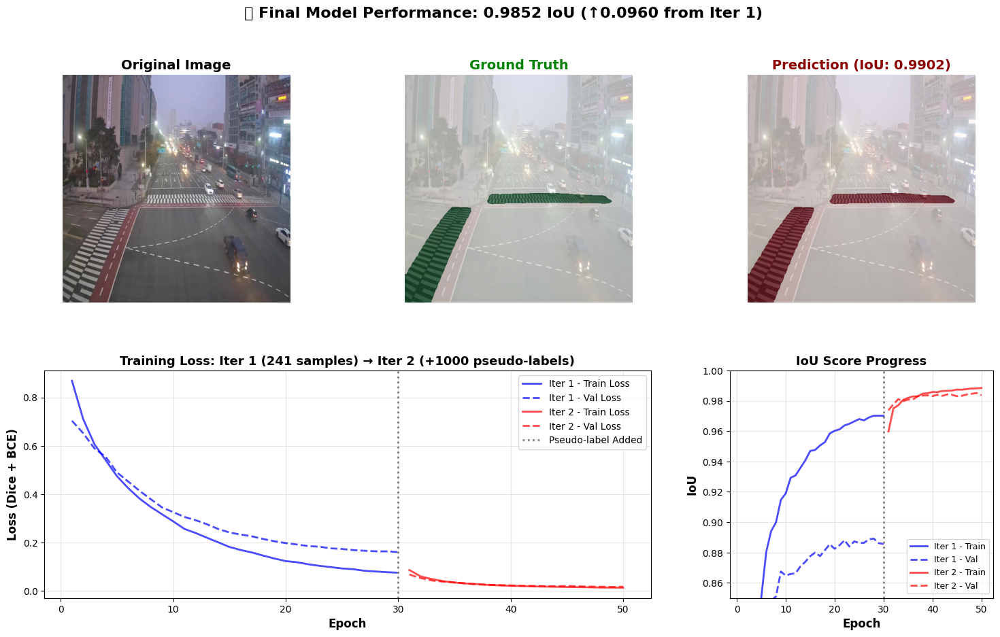

In [34]:
# Cell 17: Final Results Visualization - Sample Prediction & Training Curves

fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)

# ============ TOP ROW: Sample Prediction ============
model.eval()
with torch.no_grad():
    # Get one random validation sample
    sample_idx = random.randint(0, len(val_dataset_iter2) - 1)
    image, mask_gt, img_path = val_dataset_iter2[sample_idx]
    
    # Predict
    image_tensor = image.unsqueeze(0).to(device)
    output = model(image_tensor)
    pred_mask = torch.sigmoid(output).cpu().squeeze()
    pred_mask_binary = (pred_mask > 0.5).float()
    
    # Denormalize image
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image_denorm = image * std + mean
    image_denorm = image_denorm.permute(1, 2, 0).numpy()
    image_denorm = np.clip(image_denorm, 0, 1)
    
    mask_gt_np = mask_gt.squeeze().numpy()
    
    # Calculate IoU
    intersection = (pred_mask_binary * mask_gt.squeeze()).sum()
    union = pred_mask_binary.sum() + mask_gt.squeeze().sum() - intersection
    iou = (intersection / (union + 1e-6)).item()
    
    # Plot sample
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(image_denorm)
    ax1.set_title('Original Image', fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(image_denorm)
    ax2.imshow(mask_gt_np, alpha=0.6, cmap='Greens')
    ax2.set_title('Ground Truth', fontsize=14, fontweight='bold', color='green')
    ax2.axis('off')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(image_denorm)
    ax3.imshow(pred_mask_binary, alpha=0.6, cmap='Reds')
    ax3.set_title(f'Prediction (IoU: {iou:.4f})', fontsize=14, fontweight='bold', color='darkred')
    ax3.axis('off')

# ============ BOTTOM ROW: Training Curves ============

# Loss plot
ax4 = fig.add_subplot(gs[1, :2])
epochs_iter1 = range(1, len(history['train_loss']) + 1)
epochs_iter2 = range(len(history['train_loss']) + 1, len(history['train_loss']) + len(history_iter2['train_loss']) + 1)

# Iter 1
ax4.plot(epochs_iter1, history['train_loss'], 'b-', linewidth=2, label='Iter 1 - Train Loss', alpha=0.7)
ax4.plot(epochs_iter1, history['val_loss'], 'b--', linewidth=2, label='Iter 1 - Val Loss', alpha=0.7)

# Iter 2
ax4.plot(epochs_iter2, history_iter2['train_loss'], 'r-', linewidth=2, label='Iter 2 - Train Loss', alpha=0.7)
ax4.plot(epochs_iter2, history_iter2['val_loss'], 'r--', linewidth=2, label='Iter 2 - Val Loss', alpha=0.7)

# Mark transition
ax4.axvline(x=len(history['train_loss']), color='gray', linestyle=':', linewidth=2, label='Pseudo-label Added')

ax4.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax4.set_ylabel('Loss (Dice + BCE)', fontsize=12, fontweight='bold')
ax4.set_title('Training Loss: Iter 1 (241 samples) → Iter 2 (+1000 pseudo-labels)', fontsize=13, fontweight='bold')
ax4.legend(loc='upper right', fontsize=10)
ax4.grid(True, alpha=0.3)

# IoU plot
ax5 = fig.add_subplot(gs[1, 2])
ax5.plot(epochs_iter1, history['train_iou'], 'b-', linewidth=2, label='Iter 1 - Train', alpha=0.7)
ax5.plot(epochs_iter1, history['val_iou'], 'b--', linewidth=2, label='Iter 1 - Val', alpha=0.7)
ax5.plot(epochs_iter2, history_iter2['train_iou'], 'r-', linewidth=2, label='Iter 2 - Train', alpha=0.7)
ax5.plot(epochs_iter2, history_iter2['val_iou'], 'r--', linewidth=2, label='Iter 2 - Val', alpha=0.7)
ax5.axvline(x=len(history['train_iou']), color='gray', linestyle=':', linewidth=2)

ax5.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax5.set_ylabel('IoU', fontsize=12, fontweight='bold')
ax5.set_title('IoU Score Progress', fontsize=13, fontweight='bold')
ax5.legend(loc='lower right', fontsize=9)
ax5.grid(True, alpha=0.3)
ax5.set_ylim([0.85, 1.0])

plt.suptitle(f'🎯 Final Model Performance: {BEST_IOU_ITER2:.4f} IoU (↑{BEST_IOU_ITER2-BEST_IOU:.4f} from Iter 1)', 
             fontsize=16, fontweight='bold', y=0.98)

plt.savefig(f"{OUTPUT_DIR}/final_results.png", dpi=150, bbox_inches='tight')
plt.show()

